# Modelling the Stock Market
### by Jérôme Blanchet


# Abstract


My name is Jerome Blanchet, my educational background is in pure mathematics and economics. I am senior analyst at CMHC national office. This is my personal data science site at Github. This is actually my first notebook ever and I am very excited about it. 
I am interested about Numerai, a Silicon Valley firm focusing about predicting the Stock Market. The dataset include many advantages and also disadvantages. First of all, the dataset is very clean. There is 21 continuous variable and all of them are normalized, uniformely distributed with no outliers and no missing value. The target rate is near 50%. That kind of dataset is perfect for spending less time on preprocessing and focusing more about testing new algorithms. The main drawback of the dataset is its structural nature. The stock market data is well knowns to be very chaotic. 


# Table of Contents

Part 1) Data Description .................................................................................................XXX
 
Part 2) Data Interaction..................................................................................................XXX
 
Part 3) Benchmark (Modelling without any Preprocessing)...................................................................XXX
 
3.1 Manual Tuning with Various Algorithms................................................................................................................XXX

3.2 Manual Tuning with Neural Network.....................................................................................XXX
 
Part 4) Preprocessing.....................................................................................................XXX

4.1 Dimensionality Reduction with PCA.....................................................................................XXX

4.2 Dimensionality Reduction with T-distributed stochastic neighbor embedding (t-SNE) on top of PCA.......................XXX
 
Part 5) Grid Search, Random Search and Bayesian Hyperparameter Search.....................................................XXX

# Part 1) Data Description

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np
from scipy.stats import skew
from scipy.stats.stats import pearsonr
import seaborn as sns
from pandas import DataFrame
import time

import sys
print('Python: {}'.format(sys.version))
import scipy
print('scipy: {}'.format(scipy.__version__))
import numpy
print('numpy: {}'.format(numpy.__version__))
import matplotlib
print('matplotlib: {}'.format(matplotlib.__version__))
import pandas
print('pandas: {}'.format(pandas.__version__))
import sklearn
print('sklearn: {}'.format(sklearn.__version__))

Python: 3.5.2 |Anaconda 4.2.0 (64-bit)| (default, Jul  5 2016, 11:41:13) [MSC v.1900 64 bit (AMD64)]
scipy: 0.18.1
numpy: 1.11.1
matplotlib: 1.5.3
pandas: 0.18.1
sklearn: 0.17.1


In [2]:
DATATRAIN = pd.read_csv("C:/Users/jeblanch/Documents/numerai_training_data.csv")
DATATEST = pd.read_csv("C:/Users/jeblanch/Documents/numerai_tournament_data.csv")

In [38]:
DATATRAIN.shape

(96320, 22)

In [3]:
DATATEST.shape

(36068, 22)

In [4]:
LIST_OF_VARIABLE_TRAIN = DATATRAIN.columns
LIST_OF_VARIABLE_TRAIN

Index(['feature1', 'feature2', 'feature3', 'feature4', 'feature5', 'feature6',
       'feature7', 'feature8', 'feature9', 'feature10', 'feature11',
       'feature12', 'feature13', 'feature14', 'feature15', 'feature16',
       'feature17', 'feature18', 'feature19', 'feature20', 'feature21',
       'target'],
      dtype='object')

In [5]:
LIST_OF_VARIABLE_TEST = DATATEST.columns
LIST_OF_VARIABLE_TEST

Index(['t_id', 'feature1', 'feature2', 'feature3', 'feature4', 'feature5',
       'feature6', 'feature7', 'feature8', 'feature9', 'feature10',
       'feature11', 'feature12', 'feature13', 'feature14', 'feature15',
       'feature16', 'feature17', 'feature18', 'feature19', 'feature20',
       'feature21'],
      dtype='object')

In [6]:
DATATRAIN.info();

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96320 entries, 0 to 96319
Data columns (total 22 columns):
feature1     96320 non-null float64
feature2     96320 non-null float64
feature3     96320 non-null float64
feature4     96320 non-null float64
feature5     96320 non-null float64
feature6     96320 non-null float64
feature7     96320 non-null float64
feature8     96320 non-null float64
feature9     96320 non-null float64
feature10    96320 non-null float64
feature11    96320 non-null float64
feature12    96320 non-null float64
feature13    96320 non-null float64
feature14    96320 non-null float64
feature15    96320 non-null float64
feature16    96320 non-null float64
feature17    96320 non-null float64
feature18    96320 non-null float64
feature19    96320 non-null float64
feature20    96320 non-null float64
feature21    96320 non-null float64
target       96320 non-null int64
dtypes: float64(21), int64(1)
memory usage: 16.2 MB


In [7]:
DATATEST.info();

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36068 entries, 0 to 36067
Data columns (total 22 columns):
t_id         36068 non-null int64
feature1     36068 non-null float64
feature2     36068 non-null float64
feature3     36068 non-null float64
feature4     36068 non-null float64
feature5     36068 non-null float64
feature6     36068 non-null float64
feature7     36068 non-null float64
feature8     36068 non-null float64
feature9     36068 non-null float64
feature10    36068 non-null float64
feature11    36068 non-null float64
feature12    36068 non-null float64
feature13    36068 non-null float64
feature14    36068 non-null float64
feature15    36068 non-null float64
feature16    36068 non-null float64
feature17    36068 non-null float64
feature18    36068 non-null float64
feature19    36068 non-null float64
feature20    36068 non-null float64
feature21    36068 non-null float64
dtypes: float64(21), int64(1)
memory usage: 6.1 MB


In [40]:
DATATRAIN.head(10)

,feature1,feature2,feature3,feature4,feature5,feature6,feature7,feature8,feature9,feature10,...,feature13,feature14,feature15,feature16,feature17,feature18,feature19,feature20,feature21,target
0,0.240334,0.821445,0.188216,0.695935,0.275255,0.166727,0.277759,0.393617,0.605746,0.539524,...,0.468062,0.471368,0.360477,0.386518,0.099932,0.212755,0.409194,0.553828,0.729039,0
1,0.105750,0.466393,0.788368,0.368201,0.449494,0.113514,0.821350,0.391745,0.355628,0.825224,...,0.613063,0.835725,0.127212,0.425440,0.724995,0.786288,0.339586,0.822786,0.347294,0
2,0.760054,0.583935,0.889545,0.433781,0.457076,0.705108,0.696129,0.536635,0.424145,0.528493,...,0.308784,0.711350,0.876572,0.590701,0.632564,0.981630,0.357089,0.597478,0.358644,1
3,0.352680,0.661547,0.589982,0.385830,0.391617,0.450011,0.792729,0.808475,0.765055,0.725815,...,0.243030,0.855269,0.574907,0.179726,0.669091,0.769714,0.197598,0.269451,0.694055,1
4,0.019908,0.868553,0.000818,0.335975,0.389629,0.028062,0.260477,0.592177,0.368580,0.314964,...,0.088355,0.314851,0.062949,0.350093,0.015169,0.017189,0.114457,0.460919,0.772721,1
5,0.065985,0.999651,0.141204,0.387729,0.556407,0.049982,0.756564,0.993134,0.926070,0.782456,...,0.137344,0.835725,0.047316,0.206469,0.145737,0.196290,0.233053,0.179772,0.865345,1
6,0.025958,0.812446,0.020297,0.016361,0.172401,0.055885,0.728438,0.169334,0.105625,0.554313,...,0.132504,0.745825,0.306949,0.126789,0.054349,0.031609,0.207763,0.000003,0.662274,0
7,0.074530,0.414900,0.100835,0.328859,0.982829,0.049982,0.057571,0.613329,0.231352,0.916286,...,0.582715,0.514075,0.007358,0.028916,0.114864,0.088552,0.289702,0.058578,0.017698,1
8,0.289046,0.515981,0.102144,0.447891,0.922540,0.213526,0.416889,0.623394,0.398634,0.652814,...,0.182389,0.497853,0.588626,0.057155,0.194329,0.063391,0.180515,0.409485,0.949708,1
9,0.019908,0.986324,0.000818,0.984612,0.056564,0.055227,0.696424,0.999074,0.980332,0.923902,...,0.514331,0.956333,0.097617,0.908160,0.021458,0.030649,0.124785,0.925503,0.973768,0


In [41]:
DATATRAIN.tail(10)

,feature1,feature2,feature3,feature4,feature5,feature6,feature7,feature8,feature9,feature10,...,feature13,feature14,feature15,feature16,feature17,feature18,feature19,feature20,feature21,target
96310,0.176502,0.566769,0.981878,0.945782,0.276810,0.174979,0.998103,0.383129,0.640737,0.883288,...,0.550468,0.911521,0.210559,0.991422,0.939270,0.908591,0.346139,0.937858,0.744369,1
96311,0.223942,0.183409,0.049142,0.719717,0.501864,0.099969,0.716252,0.679134,0.778455,0.554346,...,0.302714,0.655940,0.167251,0.747147,0.097242,0.030649,0.521996,0.723062,0.500428,1
96312,0.336300,0.998195,0.059152,0.283737,0.122388,0.400059,0.999997,0.725081,0.862732,0.905994,...,0.026568,0.995295,0.103824,0.126391,0.098603,0.029591,0.036233,0.298445,0.913400,0
96313,0.348455,0.333061,0.742855,0.368229,0.378083,0.502218,0.188132,0.671378,0.399728,0.568182,...,0.458021,0.219953,0.960639,0.007767,0.854544,0.917074,0.486971,0.464848,0.519739,0
96314,0.211939,1.000000,0.141264,0.996355,0.788694,0.119216,0.601558,0.839129,0.727855,0.526812,...,0.631102,0.761867,0.032369,0.888108,0.041378,0.046331,0.479372,0.974270,0.957761,0
96315,0.356030,0.466154,0.133134,0.633587,0.730852,0.618656,0.203344,0.194309,0.652536,0.402444,...,0.839791,0.476402,0.667939,0.532310,0.332333,0.132560,0.791268,0.765534,0.977834,1
96316,0.979103,0.029792,0.897649,0.241760,0.889071,0.995205,0.189681,0.005047,0.058213,0.133999,...,0.908097,0.070958,0.991268,0.459192,0.927258,0.949742,0.890597,0.484764,0.021760,1
96317,0.552004,0.538605,0.057178,0.257721,0.014369,0.375819,0.327223,0.130128,0.212868,0.754834,...,0.030030,0.169064,0.147803,0.464191,0.012139,0.231630,0.036233,0.523291,0.756613,0
96318,0.983391,0.216766,0.761766,0.725756,0.513926,0.995205,0.294182,0.786691,0.338694,0.528493,...,0.395719,0.638913,0.919853,0.821184,0.473690,0.666406,0.585839,0.454968,0.016062,1
96319,0.909717,0.636406,0.385877,0.235912,0.393591,0.929659,0.639843,0.631019,0.298904,0.830670,...,0.606739,0.758202,0.845307,0.712064,0.506229,0.378119,0.420875,0.214825,0.326322,0


In [10]:
DATATEST.head(10)

,t_id,feature1,feature2,feature3,feature4,feature5,feature6,feature7,feature8,feature9,...,feature12,feature13,feature14,feature15,feature16,feature17,feature18,feature19,feature20,feature21
0,3386,0.176502,0.071846,0.760401,0.603793,0.307923,0.326370,0.714250,0.018619,0.251729,...,0.137658,0.875955,0.704441,0.491796,0.553368,0.623538,0.407551,0.657966,0.769546,0.529049
1,15031,0.328742,0.966138,0.582574,0.993283,0.429349,0.140698,0.610141,0.789572,0.959729,...,0.881440,0.556472,0.482086,0.265233,0.941844,0.390078,0.854559,0.269184,0.894264,0.982790
2,16346,0.240334,0.162792,0.403378,0.766939,0.689899,0.535853,0.325870,0.219154,0.326740,...,0.174604,0.578646,0.182698,0.210220,0.816385,0.712595,0.176998,0.771658,0.628776,0.164992
3,21943,0.472823,0.474738,0.302930,0.623849,0.086283,0.367649,0.869185,0.995174,0.986194,...,0.289700,0.053721,0.960672,0.220508,0.560766,0.216163,0.312070,0.120353,0.581951,0.579763
4,10608,0.272245,0.245075,0.690044,0.960165,0.565562,0.191646,0.265510,0.402866,0.344695,...,0.079684,0.625458,0.267750,0.300998,0.999414,0.830972,0.742335,0.643849,0.861303,0.168874
5,13147,0.073011,0.884681,0.548301,0.656253,0.200540,0.060400,0.875666,0.754155,0.806050,...,0.878738,0.096389,0.974961,0.238561,0.530308,0.489904,0.609126,0.130431,0.707005,0.946608
6,6316,0.548575,0.749222,0.823218,0.055006,0.282549,0.241622,0.289649,0.324297,0.210370,...,0.514328,0.667008,0.598804,0.761163,0.106132,0.644182,0.838805,0.499651,0.074308,0.681984
7,6107,0.337244,0.145352,0.327472,0.643769,0.118757,0.452019,0.539650,0.320263,0.471022,...,0.289332,0.610730,0.875515,0.391424,0.578357,0.203430,0.228352,0.359020,0.841741,0.423247
8,31304,0.368471,0.337428,0.356741,0.952783,0.260766,0.505094,0.696133,0.403002,0.402564,...,0.091658,0.602687,0.808628,0.663987,0.775117,0.517211,0.679346,0.451790,0.984150,0.261506
9,7913,0.023972,0.934979,0.021236,0.922424,0.108549,0.138535,0.875666,0.923405,0.920887,...,0.918814,0.018492,0.987315,0.144273,0.757315,0.008083,0.203948,0.018583,0.913834,0.897416


In [11]:
DATATEST.tail(10)

,t_id,feature1,feature2,feature3,feature4,feature5,feature6,feature7,feature8,feature9,...,feature12,feature13,feature14,feature15,feature16,feature17,feature18,feature19,feature20,feature21
36058,19259,0.523991,0.793606,0.697335,0.711760,0.421294,0.433267,0.764556,0.890915,0.852651,...,0.743973,0.261150,0.808525,0.739128,0.677730,0.611458,0.800880,0.096275,0.695423,0.658975
36059,11731,0.914870,0.297459,0.942565,0.309791,0.758518,0.754079,0.947383,0.303245,0.662519,...,0.369877,0.078251,0.709705,0.588619,0.033180,0.825933,0.876671,0.188566,0.314155,0.261463
36060,31795,0.640791,0.081833,0.742818,0.496693,0.343533,0.394037,0.081409,0.042411,0.520098,...,0.540852,0.747386,0.505349,0.967458,0.370510,0.631858,0.908623,0.658474,0.980180,0.502926
36061,35140,0.928270,0.122193,0.663446,0.789762,0.479364,0.991619,0.347125,0.737124,0.848733,...,0.105146,0.514483,0.469391,0.955680,0.983580,0.911551,0.876671,0.449672,0.455429,0.007872
36062,19749,0.368471,0.669534,0.098075,0.553528,0.483324,0.934627,0.068827,0.604151,0.209044,...,0.386505,0.820694,0.451404,0.507394,0.654210,0.375967,0.159814,0.479437,0.234370,0.646836
36063,34825,0.229924,0.522585,0.224033,0.608738,0.850340,0.204239,0.708213,0.823260,0.854722,...,0.266418,0.394360,0.816355,0.459658,0.413875,0.149788,0.511595,0.277464,0.652344,0.389424
36064,28661,0.232006,0.036735,0.016110,0.937383,0.193579,0.456534,0.720283,0.542888,0.777310,...,0.245005,0.739411,0.897916,0.325190,0.958455,0.065224,0.047403,0.430638,0.961065,0.257482
36065,28029,0.170819,0.376142,0.104058,0.576250,0.170613,0.103123,0.114584,0.032431,0.115684,...,0.490515,0.325861,0.032075,0.261642,0.639008,0.125055,0.200552,0.584159,0.398318,0.633713
36066,24445,0.580027,0.269963,0.999422,0.243885,0.882878,0.950641,0.032077,0.316402,0.305345,...,0.173216,0.781514,0.135811,0.606451,0.417508,0.928700,0.969049,0.995583,0.320254,0.398299
36067,14160,0.777298,0.202355,0.499723,0.179951,0.035015,0.631239,0.164946,0.036768,0.127507,...,0.465643,0.037666,0.142782,0.626282,0.003867,0.526750,0.057566,0.089250,0.238636,0.681989


The number of missing value is zero for all variable

In [12]:
DATATRAIN.isnull().any()

feature1     False
feature2     False
feature3     False
feature4     False
feature5     False
feature6     False
feature7     False
feature8     False
feature9     False
feature10    False
feature11    False
feature12    False
feature13    False
feature14    False
feature15    False
feature16    False
feature17    False
feature18    False
feature19    False
feature20    False
feature21    False
target       False
dtype: bool

In [13]:
DATATEST.isnull().any()

t_id         False
feature1     False
feature2     False
feature3     False
feature4     False
feature5     False
feature6     False
feature7     False
feature8     False
feature9     False
feature10    False
feature11    False
feature12    False
feature13    False
feature14    False
feature15    False
feature16    False
feature17    False
feature18    False
feature19    False
feature20    False
feature21    False
dtype: bool

In [42]:
DATATRAIN.describe()

,feature1,feature2,feature3,feature4,feature5,feature6,feature7,feature8,feature9,feature10,...,feature13,feature14,feature15,feature16,feature17,feature18,feature19,feature20,feature21,target
count,96320.000000,96320.000000,96320.000000,96320.000000,96320.000000,96320.000000,96320.000000,96320.000000,96320.000000,96320.000000,...,96320.000000,96320.000000,96320.000000,96320.000000,96320.000000,96320.000000,96320.000000,96320.000000,96320.000000,96320.000000
mean,0.490624,0.506526,0.501153,0.511202,0.482551,0.495704,0.485308,0.498239,0.510794,0.495533,...,0.497240,0.499253,0.495861,0.530852,0.499036,0.498495,0.509935,0.489330,0.505263,0.505170
std,0.287678,0.295668,0.289097,0.294220,0.291502,0.289780,0.288916,0.292319,0.300019,0.282865,...,0.284514,0.298824,0.289826,0.295788,0.284427,0.295677,0.284826,0.286131,0.292375,0.499976
min,0.000162,0.000000,0.000000,0.000000,0.000000,0.000021,0.000000,0.000000,0.000000,0.000000,...,0.000111,0.000013,0.000000,0.000000,0.000000,0.000000,0.000045,0.000003,0.000626,0.000000
25%,0.244734,0.244226,0.259109,0.252076,0.232631,0.233360,0.240383,0.240802,0.247976,0.252352,...,0.259664,0.229475,0.255347,0.269598,0.260134,0.235475,0.268794,0.252535,0.257578,0.000000
50%,0.488900,0.514579,0.493395,0.503746,0.469295,0.500993,0.482828,0.500036,0.502065,0.495351,...,0.504632,0.499284,0.494369,0.533040,0.510162,0.499798,0.515547,0.469587,0.506960,1.000000
75%,0.746915,0.761702,0.761766,0.777905,0.738110,0.746194,0.734963,0.748607,0.784585,0.734211,...,0.740331,0.754282,0.745505,0.798631,0.745460,0.758530,0.758363,0.735136,0.753504,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [15]:
DATATEST.describe()

,t_id,feature1,feature2,feature3,feature4,feature5,feature6,feature7,feature8,feature9,...,feature12,feature13,feature14,feature15,feature16,feature17,feature18,feature19,feature20,feature21
count,36068.000000,36068.000000,36068.000000,36068.000000,36068.000000,36068.000000,36068.000000,36068.000000,3.606800e+04,36068.000000,...,36068.000000,36068.000000,36068.000000,36068.000000,36068.000000,36068.000000,36068.000000,36068.000000,36068.000000,36068.000000
mean,18034.500000,0.485036,0.506344,0.498644,0.512040,0.481700,0.484690,0.486572,4.982109e-01,0.507894,...,0.485024,0.496269,0.501611,0.494054,0.534660,0.492300,0.497932,0.509878,0.489155,0.507944
std,10412.079091,0.286279,0.294379,0.288053,0.291243,0.287656,0.286976,0.286309,2.913888e-01,0.297944,...,0.293149,0.283932,0.297590,0.285308,0.291287,0.283594,0.292439,0.284515,0.283571,0.288992
min,1.000000,0.000000,0.000557,0.000588,0.000677,0.000076,0.000000,0.000869,8.605150e-07,0.000006,...,0.000157,0.000000,0.000000,0.000904,0.000198,0.000017,0.000047,0.000000,0.000003,0.000626
25%,9017.750000,0.241214,0.245075,0.258238,0.252076,0.233221,0.223220,0.245494,2.465905e-01,0.249377,...,0.226042,0.261112,0.240828,0.261642,0.291781,0.247901,0.238305,0.269184,0.249947,0.265444
50%,18034.500000,0.483991,0.514437,0.492173,0.500149,0.469341,0.477007,0.482941,4.999997e-01,0.498266,...,0.473827,0.502221,0.501321,0.494369,0.535047,0.506127,0.500799,0.513511,0.472514,0.509609
75%,27051.250000,0.737348,0.761005,0.757661,0.777718,0.730852,0.733230,0.732388,7.466455e-01,0.779003,...,0.752297,0.739343,0.755059,0.737564,0.797524,0.730893,0.754600,0.759685,0.732251,0.752837
max,36068.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000e+00,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


The data are extremely well balanced. The proportion of bad and good (0,1) in the target variable is near 50%. The need to use over-sampling method is not the priority for that kind of dataset

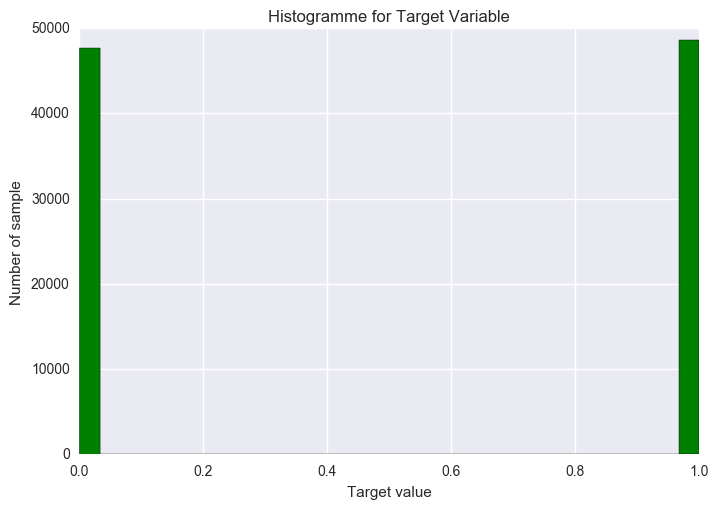

In [86]:
DATATRAIN.target.hist(bins=30, color='g')
plt.xlabel('Target value')
plt.ylabel('Number of sample')
plt.title('Histogramme for Target Variable')
plt.show()

In [17]:
TARGET_FREQUENCE = pd.DataFrame(DATATRAIN.target.value_counts())
TARGET_FREQUENCE['Percentage'] = 100*TARGET_FREQUENCE['target']/DATATRAIN.shape[0]
TARGET_FREQUENCE

,target,Percentage
1,48658,50.517027
0,47662,49.482973


# Part 2) Data Interaction

The scatter matrix is a powerful tool allowing us to learn about the correlation available among the continuous variables and the histogramme distribution of each continuous variable (i.e. diagonal). The variables are not normally distributed, it is more about uniformlly distributed. The target variable (red and blue) appear to propose clusters of value.

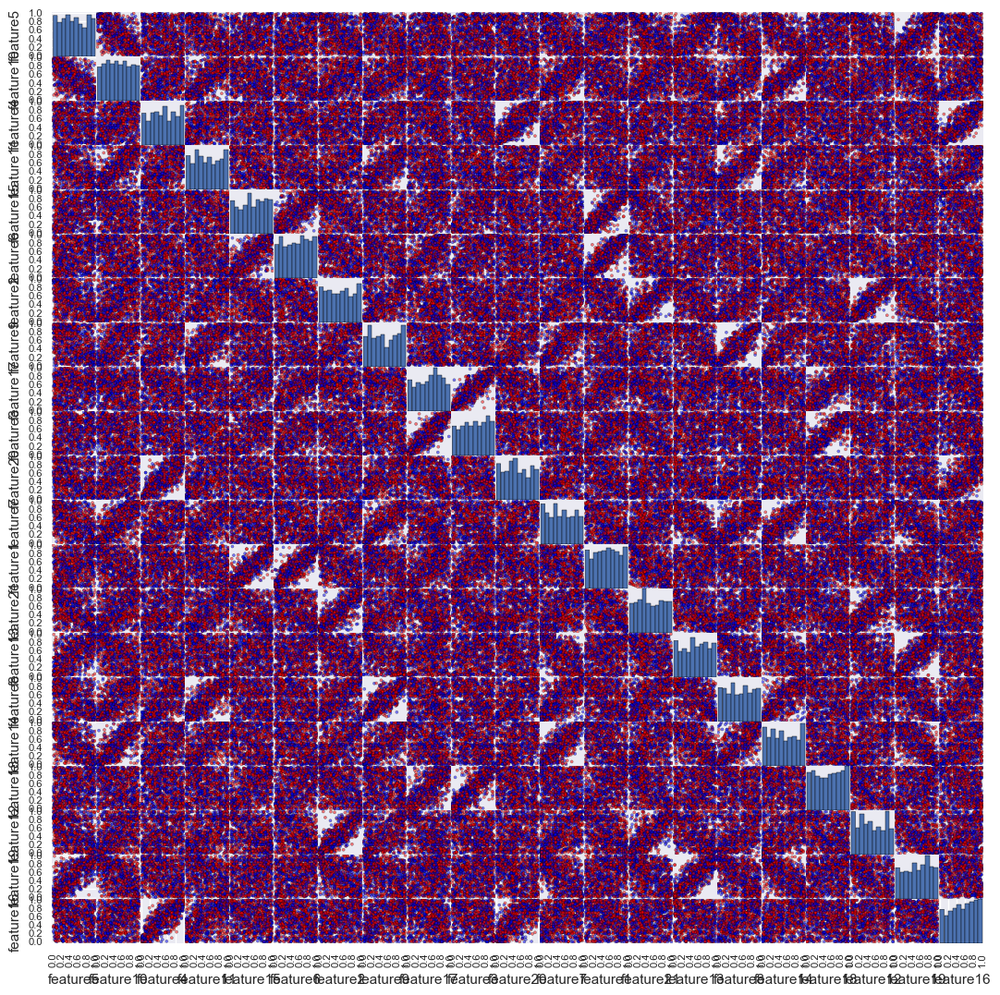

In [3]:
from pandas.tools.plotting import scatter_matrix
colors = {0:'blue', 1:'red'}
sample1 = DATATRAIN.sample(n=1000, replace=False, random_state=42, axis=0)
covariates = list(set(sample1.columns).difference({'target'}))
scatter_matrix(sample1.ix[:,covariates], figsize=(13, 13), diagonal='hist', c=sample1["target"].apply(lambda x:colors[x]));

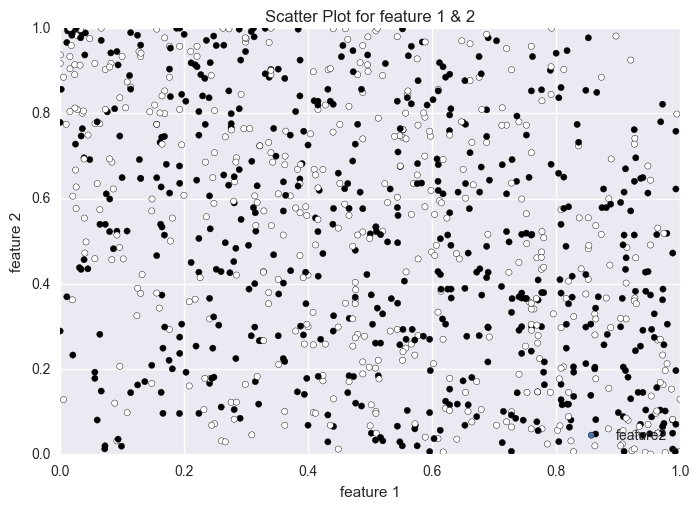

In [4]:
plt.scatter(sample1.feature1, sample1.feature2, c=sample1.target)
plt.xlabel('feature 1')
plt.ylabel('feature 2')
plt.title('Scatter Plot for feature 1 & 2')
plt.ylim([0,1])
plt.xlim([0,1])
plt.legend(loc='lower right')
plt.show();

In [5]:
MC = sample1.corr()
MC

,feature1,feature2,feature3,feature4,feature5,feature6,feature7,feature8,feature9,feature10,...,feature13,feature14,feature15,feature16,feature17,feature18,feature19,feature20,feature21,target
feature1,1.000000,-0.347095,0.395561,-0.171789,0.197887,0.825142,-0.179227,-0.222167,-0.181918,-0.213458,...,0.120681,-0.241312,0.810724,-0.156972,0.360581,0.289938,0.181517,-0.164189,-0.300053,0.030031
feature2,-0.347095,1.000000,-0.229483,0.115834,-0.326515,-0.261605,0.300935,0.348634,0.321090,0.287636,...,-0.313103,0.351141,-0.314961,0.078284,-0.218187,-0.172484,-0.375861,0.114331,0.778518,-0.028620
feature3,0.395561,-0.229483,1.000000,-0.178170,0.104493,0.329956,-0.105786,-0.129537,-0.126802,-0.112476,...,0.076985,-0.127469,0.319374,-0.166334,0.847197,0.799148,0.091556,-0.180399,-0.237376,0.060554
feature4,-0.171789,0.115834,-0.178170,1.000000,-0.150262,-0.190184,0.231172,0.389714,0.326478,0.208407,...,-0.173042,0.265820,-0.123068,0.803723,-0.213984,-0.102527,-0.202072,0.777544,0.123654,0.027954
feature5,0.197887,-0.326515,0.104493,-0.150262,1.000000,0.146229,-0.381592,-0.330023,-0.285797,-0.571790,...,0.509275,-0.514781,0.188907,-0.132586,0.101157,0.121580,0.711049,-0.154686,-0.349820,-0.054894
feature6,0.825142,-0.261605,0.329956,-0.190184,0.146229,1.000000,-0.174730,-0.172805,-0.173453,-0.172924,...,0.127955,-0.190246,0.682661,-0.185974,0.416729,0.236258,0.118999,-0.156616,-0.236443,0.015409
feature7,-0.179227,0.300935,-0.105786,0.231172,-0.381592,-0.174730,1.000000,0.572812,0.634407,0.585034,...,-0.556283,0.796702,-0.116760,0.170619,-0.119536,-0.062429,-0.510844,0.258134,0.224790,0.033725
feature8,-0.222167,0.348634,-0.129537,0.389714,-0.330023,-0.172805,0.572812,1.000000,0.841300,0.501095,...,-0.355640,0.641003,-0.174042,0.293087,-0.114520,-0.091559,-0.404643,0.336201,0.280404,0.022613
feature9,-0.181918,0.321090,-0.126802,0.326478,-0.285797,-0.173453,0.634407,0.841300,1.000000,0.435625,...,-0.367486,0.561483,-0.158108,0.263892,-0.126704,-0.092528,-0.345861,0.390427,0.257452,0.032560
feature10,-0.213458,0.287636,-0.112476,0.208407,-0.571790,-0.172924,0.585034,0.501095,0.435625,1.000000,...,-0.320223,0.750934,-0.182973,0.223568,-0.091636,-0.112539,-0.432125,0.205340,0.286943,0.068613


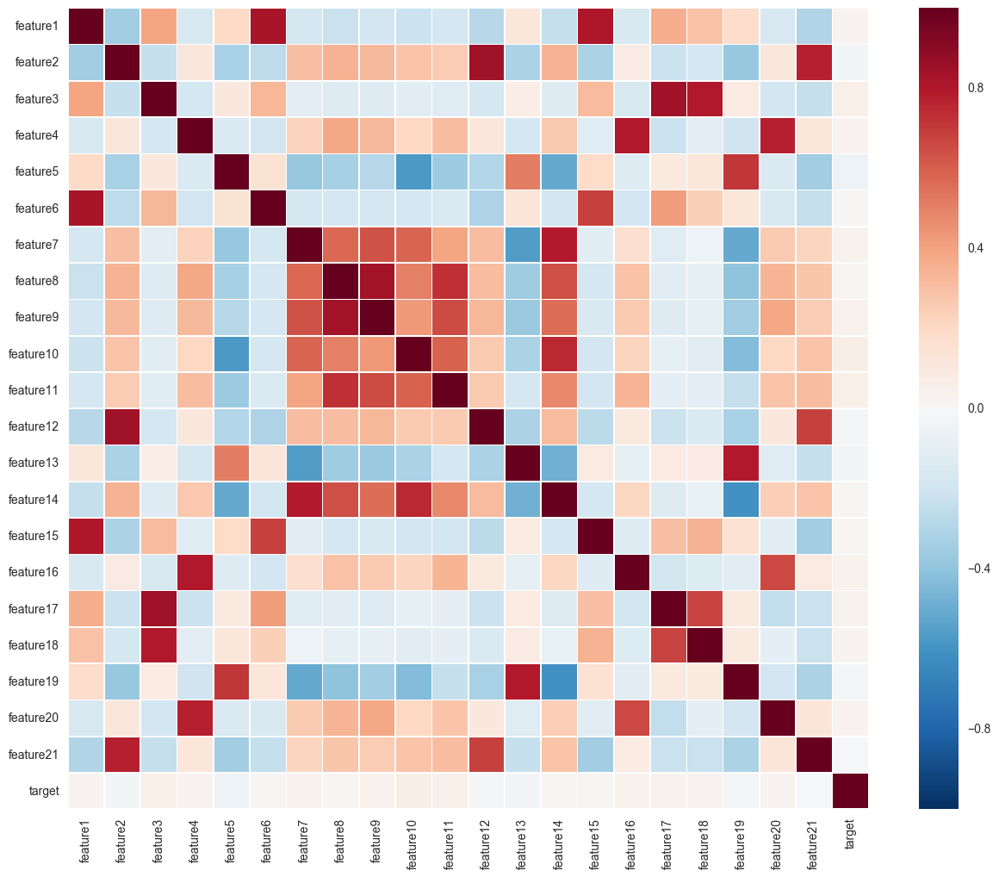

In [33]:
f, ax = plt.subplots(figsize=(15, 12))
sns.heatmap(MC,linewidths=.5, ax=ax);

In [45]:
threshold = 0.5
important_corrs = (MC[abs(MC) > threshold][MC != 1.0]) .unstack().dropna().to_dict()
unique_important_corrs = pd.DataFrame(list(set([(tuple(sorted(key)), important_corrs[key]) 
for key in important_corrs])), columns=['feature pair', 'correlation coefficient'])

unique_important_corrs = unique_important_corrs.ix[abs(unique_important_corrs['correlation coefficient']).argsort()[::-1]]
unique_important_corrs

,feature pair,correlation coefficient
26,"(feature17, feature3)",0.847197
3,"(feature12, feature2)",0.846103
27,"(feature8, feature9)",0.841300
10,"(feature1, feature6)",0.825142
23,"(feature1, feature15)",0.810724
13,"(feature16, feature4)",0.803723
20,"(feature13, feature19)",0.801000
28,"(feature18, feature3)",0.799148
7,"(feature14, feature7)",0.796702
2,"(feature2, feature21)",0.778518


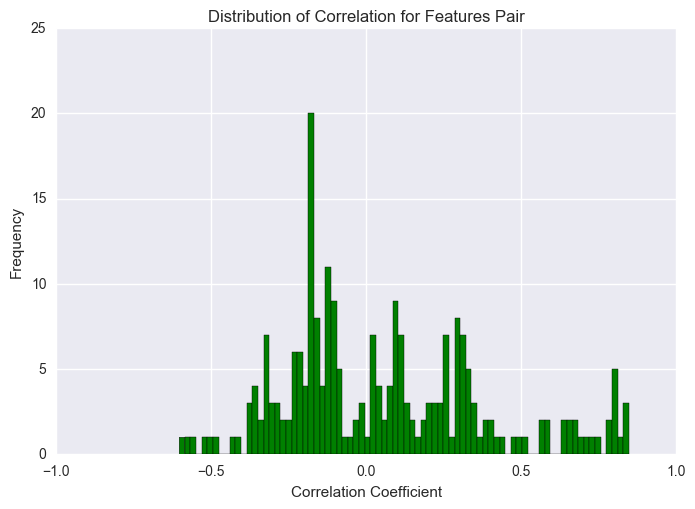

In [89]:
threshold = 0.000
important_corrs = (MC[abs(MC) > threshold][MC != 1.0]) .unstack().dropna().to_dict()
unique_important_corrs = pd.DataFrame(list(set([(tuple(sorted(key)), important_corrs[key]) 
for key in important_corrs])), columns=['feature pair', 'correlation coefficient'])

unique_important_corrs1 = unique_important_corrs.ix[abs(unique_important_corrs['correlation coefficient']).argsort()[::-1]]

unique_important_corrs1.hist(bins=80, color='g')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Frequency')
plt.ylim([0,25])
plt.xlim([-1,1])
plt.title('Distribution of Correlation for Features Pair')
plt.show();

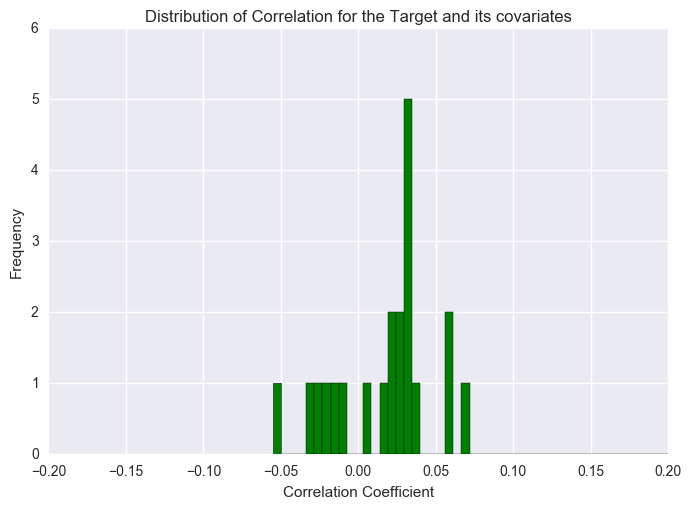

In [97]:
MC.target.hist(bins=200, color='g')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Frequency')
plt.ylim([0,6])
plt.xlim([-0.2,0.2])
plt.title('Distribution of Correlation for the Target and its covariates')
plt.show();

# Part 3) Benchmark (Modelling without any Preprocessing)

# 3.1 Manual Tuning with Various Algorithms

In [3]:
trainx = DATATRAIN.columns[:-1]
trainy = DATATRAIN.columns[-1]

X = DATATRAIN[trainx]
Y = DATATRAIN[trainy]

from sklearn.cross_validation import train_test_split
from sklearn.cross_validation import KFold, cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import roc_auc_score
from sklearn.metrics import make_scorer
from sklearn.grid_search import GridSearchCV
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier, ExtraTreesClassifier, GradientBoostingClassifier, VotingClassifier, RandomForestClassifier, AdaBoostClassifier

seed = 1

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.5, random_state=0)

In [13]:
start_time = time.clock()

print("")
print("")
print("") 
print("List of Average ROC AUC According to the Algorithm (Training Dataset with K-Fold Cross-validation)")
print("") 

N_ES = 100
K = 10

start_time = time.clock()

model1 = LogisticRegression()
results1 = cross_val_score(model1, X_train, y_train, cv=K, scoring='roc_auc', n_jobs=1)
print("Logistic Regression (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results1.mean(), results1.std()))

model2 = KNeighborsClassifier(n_neighbors=5)
results2 = cross_val_score(model2, X_train, y_train, cv=K, scoring='roc_auc', n_jobs=1)
print("K Neighbors Classifier (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results2.mean(), results2.std()))

model3 = DecisionTreeClassifier()
results3 = cross_val_score(model3, X_train, y_train, cv=K, scoring='roc_auc', n_jobs=1)
print("Decision Tree Classifier (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results3.mean(), results3.std()))

model4 = BaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=N_ES, random_state=seed)
results4 = cross_val_score(model4, X_train, y_train, cv=K, scoring='roc_auc', n_jobs=1)
print("Bagging Decision Tree (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results4.mean(), results4.std()))

model5 = RandomForestClassifier(n_estimators=N_ES, max_features=5)
results5 = cross_val_score(model5, X_train, y_train, cv=K, scoring='roc_auc', n_jobs=1)
print("Random Forest (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results5.mean(), results5.std()))

model6 = ExtraTreesClassifier(n_estimators=N_ES, max_features=5)
results6 = cross_val_score(model6, X_train, y_train, cv=K, scoring='roc_auc', n_jobs=1)
print("Extra Randomized Forest (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results6.mean(), results6.std()))

model7 = AdaBoostClassifier(n_estimators=N_ES, random_state=seed)
results7 = cross_val_score(model7, X_train, y_train, cv=K, scoring='roc_auc', n_jobs=1)
print("AdaBoost Classifier (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results7.mean(), results7.std()))

model8 = GradientBoostingClassifier(n_estimators=N_ES, random_state=seed)
results8 = cross_val_score(model8, X_train, y_train, cv=K, scoring='roc_auc', n_jobs=1)
print("Gradient Boosting Classifier (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results8.mean(), results8.std()))

end_time = time.clock()




List of Average ROC AUC According to the Algorithm (Training Dataset with K-Fold Cross-validation)

Logistic Regression (Manual Tuning): (0.529) +/- (0.006)
K Neighbors Classifier (Manual Tuning): (0.504) +/- (0.004)
Decision Tree Classifier (Manual Tuning): (0.501) +/- (0.006)
Bagging Decision Tree (Manual Tuning): (0.514) +/- (0.008)
Random Forest (Manual Tuning): (0.510) +/- (0.009)
Extra Randomized Forest (Manual Tuning): (0.516) +/- (0.003)
AdaBoost Classifier (Manual Tuning): (0.516) +/- (0.008)
Gradient Boosting Classifier (Manual Tuning): (0.520) +/- (0.009)


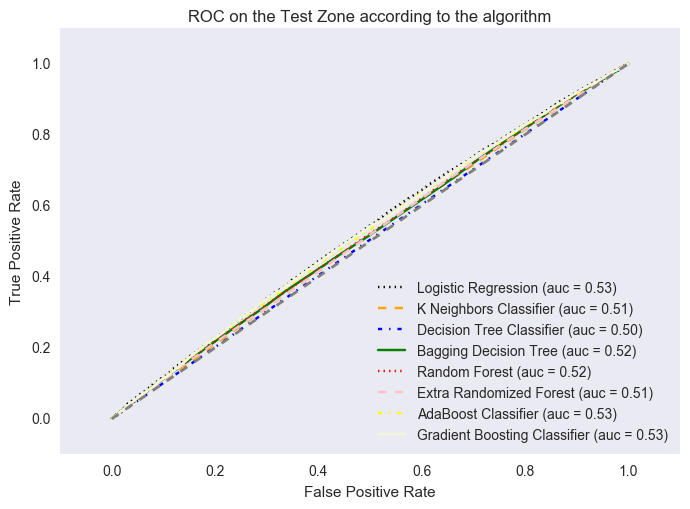

In [15]:
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

all_clf = [model1, model2, model3, model4, model5, model6, model7, model8]

clf_labels = ['Logistic Regression', 'K Neighbors Classifier', 'Decision Tree Classifier', 'Bagging Decision Tree', 'Random Forest', 'Extra Randomized Forest', 'AdaBoost Classifier', 'Gradient Boosting Classifier']

colors = ['black', 'orange', 'blue', 'green', 'red', 'pink', 'yellow', 'beige']

linestyles = [':', '--', '-.', '-',':', '--', '-.', '-']

for clf, label, clr, ls in zip(all_clf, clf_labels, colors, linestyles):
    y_pred = clf.fit(X_train, y_train).predict_proba(X_test)[:, 1]
    fpr, tpr, thresholds = roc_curve(y_true=y_test, y_score=y_pred)
    roc_auc = auc(x=fpr, y=tpr)
    plt.plot(fpr, tpr, color=clr, linestyle=ls, label='%s (auc = %0.2f)' % (label, roc_auc))

plt.legend(loc='lower right')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', linewidth=2)

plt.xlim([-0.1, 1.1])
plt.ylim([-0.1, 1.1])
plt.grid()
plt.title('ROC on the Test Zone according to the algorithm')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

plt.show()

# 3.2 Manual Tuning with Neural Network

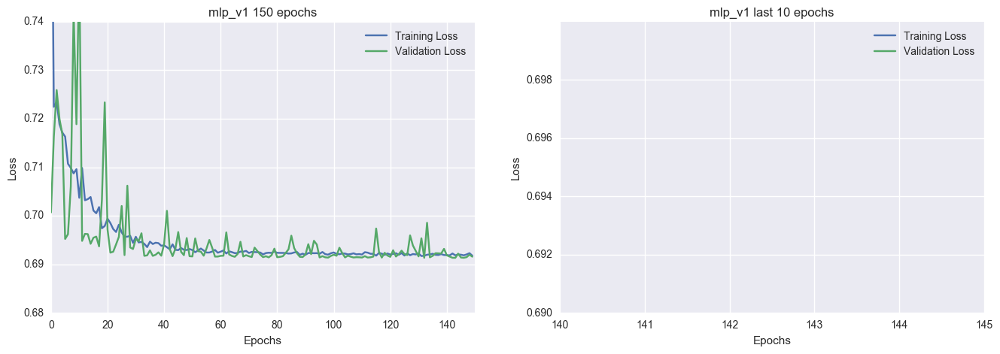

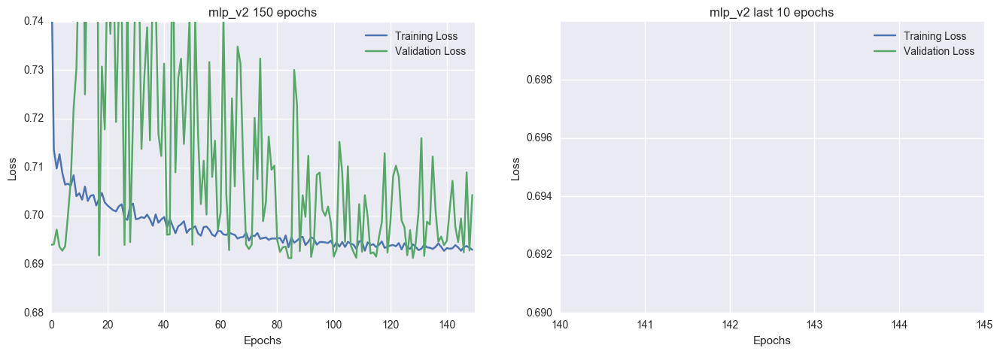

In [22]:
from keras.models import Sequential
from keras.models import save_model, load_model
from keras.layers.advanced_activations import PReLU
from keras.layers import Dense, Dropout, Activation, BatchNormalization
from keras.callbacks import EarlyStopping

model = Sequential()
model.add(Dense(400, input_dim=DATATRAIN[trainx].shape[1]))
model.add(Activation('sigmoid'))
model.add(Dense(300))
model.add(Activation('sigmoid'))
model.add(Dense(1))
model.add(Activation('sigmoid'))
model.compile(loss='binary_crossentropy', optimizer="rmsprop")

fit = model.fit(DATATRAIN[trainx].values, DATATRAIN[trainy], validation_split=0.2, batch_size=5000, nb_epoch=150, verbose=0)

hist = fit.history

models_history = {}
models_history['mlp_v1'] = hist

model = Sequential()
model.add(Dense(400, input_dim=DATATRAIN[trainx].shape[1]))
model.add(Dropout(0.5))
model.add(Activation('sigmoid'))
model.add(Dense(300))
model.add(Dropout(0.5))
model.add(Activation('sigmoid'))
model.add(Dense(1))
model.add(Activation('sigmoid'))
model.compile(loss='binary_crossentropy', optimizer="rmsprop")

fit1 = model.fit(DATATRAIN[trainx].values, DATATRAIN[trainy], validation_split=0.2, batch_size=5000, nb_epoch=150, verbose=0)

hist1 = fit1.history

models_history['mlp_v2'] = hist1

def plot_mlp_loss(history, title):
    fig, (ax1, ax2) = plt.subplots(1,2)
    fig.set_size_inches(16,5)

    ax1.set_title('{} 150 epochs'.format(title))
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Loss')
    ax1.set_xlim([0,150])
    ax1.set_ylim([0.68,0.74])
    ax1.grid(True)
    ax1.plot(history['loss'][0:150], label='Training Loss')
    ax1.plot(history['val_loss'][0:150], label='Validation Loss')
    ax1.legend()

    ax2.set_title('{} last 10 epochs'.format(title))
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Loss')
    ax2.set_xlim([140,150])
    ax2.set_ylim([0.69,0.70])
    ax2.grid(True)
    ax2.set_xticklabels(range(140,150,1))
    ax2.plot(history['loss'][140:150], label='Training Loss')
    ax2.plot(history['val_loss'][140:150], label='Validation Loss')
    ax2.legend()
    
plot_mlp_loss(models_history['mlp_v1'], 'mlp_v1')  
plot_mlp_loss(models_history['mlp_v2'], 'mlp_v2')

The use of Dropout for regularization is not working

# 4) Preprocessing the Data

# 4.1 Dimensionality Reduction with PCA

In [4]:
from sklearn import decomposition

DATATRAIN_matrix = DATATRAIN.as_matrix()
PCA = decomposition.PCA(n_components=20)
FACTOR_matrix = PCA.fit_transform(DATATRAIN_matrix[:,:-1])
FACTOR_DF = pd.DataFrame(FACTOR_matrix)
FACTOR_DF.head(10)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,-0.429555,0.694317,-0.135925,-0.002578,0.198744,0.183172,-0.026735,-0.050689,-0.212074,-0.161374,-0.091315,0.066076,-0.019993,0.060577,-0.206265,0.087172,-0.041256,0.012963,0.095921,-0.031172
1,-0.316584,-0.066286,-0.194630,0.107092,-0.716261,0.270906,0.110102,0.553827,-0.152881,-0.148063,-0.004696,0.095425,0.284278,0.022730,0.197979,0.005280,0.063238,-0.028372,-0.015648,-0.001661
2,0.045567,-0.797432,-0.123630,0.051750,0.091450,0.165136,-0.115573,0.156535,-0.202431,0.174474,-0.077925,-0.045853,0.084732,-0.078371,0.202398,-0.041698,0.038646,0.111874,-0.087347,-0.039196
3,-0.522185,-0.468467,-0.523371,-0.106236,-0.237862,-0.167934,-0.191979,0.056033,0.009254,-0.034946,-0.239643,-0.082513,-0.100051,0.046681,-0.104850,-0.066946,0.013148,-0.047832,0.043336,-0.002521
4,-0.624160,1.130548,-0.478788,-0.116335,0.129016,0.304652,-0.357879,-0.321750,0.018902,0.013637,-0.109500,0.034195,0.143358,0.010020,-0.038075,0.119051,0.022068,0.014518,-0.109310,0.011370
5,-1.327780,0.477891,-0.553104,0.000935,-0.146141,-0.541505,-0.273253,-0.140949,0.131315,0.185453,-0.155345,-0.120619,0.123851,-0.034769,-0.059581,0.056628,-0.082952,0.012423,0.068578,0.023848
6,-0.486918,0.954677,-1.034094,-0.620403,0.051821,0.191935,-0.063314,0.214221,-0.063978,0.239256,0.022836,0.046887,-0.008680,0.091154,0.102521,-0.115358,-0.035715,-0.020948,-0.082248,-0.054995
7,0.177381,1.008804,-0.210488,-0.618042,-0.539893,-0.263699,-0.082661,0.169180,0.135717,0.141006,-0.564922,0.244349,0.390831,-0.003777,-0.438330,0.375992,0.055869,0.092042,0.159962,0.052812
8,-0.315406,0.567282,-0.304937,-0.310662,0.190694,-0.192844,-0.263264,-0.030644,0.171125,-0.020994,-0.438452,-0.501903,0.170769,0.349169,-0.145489,0.149676,-0.018133,-0.099430,0.072497,-0.013260
9,-1.853236,0.513995,0.305492,0.170617,0.177757,-0.044544,0.240075,-0.095094,-0.131664,-0.097166,-0.106906,0.152347,-0.009233,0.046483,0.029317,0.063847,-0.001488,-0.065355,0.074599,-0.014267


In [55]:
PCA.explained_variance_ratio_

array([ 0.31252339,  0.15429894,  0.12758766,  0.07761714,  0.0669608 ,
        0.06381388,  0.03855168,  0.03385178,  0.01960987,  0.01711989,
        0.01403377,  0.01323165,  0.01186109,  0.00935714,  0.00809533,
        0.00789579,  0.00695358,  0.0051445 ,  0.00462476,  0.00360474])

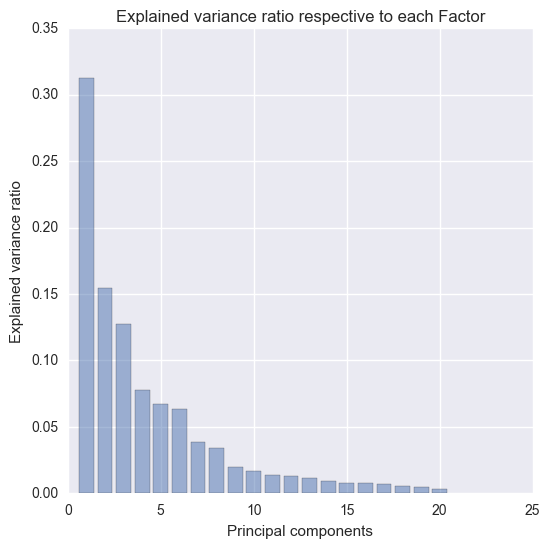

In [56]:
plt.figure(figsize = (6, 6))
plt.bar(range(1, 21), PCA.explained_variance_ratio_, alpha=0.5, align='center')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal components')
plt.title('Explained variance ratio respective to each Factor')
plt.show()

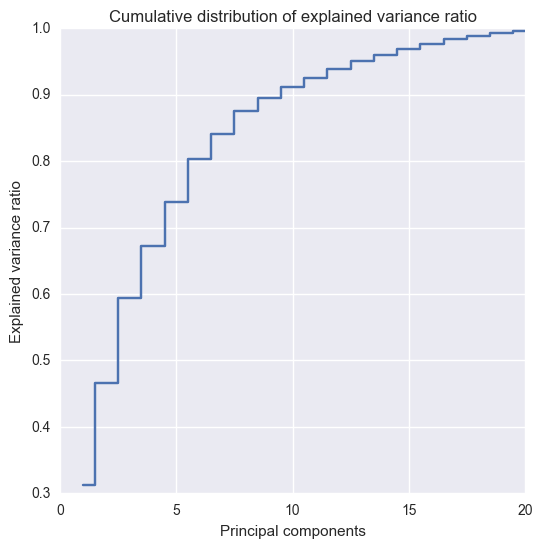

In [57]:
plt.figure(figsize = (6, 6))
plt.step(range(1, 21), np.cumsum(PCA.explained_variance_ratio_), where='mid')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal components')
plt.title('Cumulative distribution of explained variance ratio')
plt.show()

In [6]:
plt.rcParams['figure.figsize'] = (10.0, 10.0)
PROJECTION = pd.DataFrame(FACTOR_DF)
PROJECTION = PROJECTION.iloc[:,0:8]
PROJECTION.columns = ['FACTOR_1', 'FACTOR_2','FACTOR_3','FACTOR_4', 'FACTOR_5','FACTOR_6', 'FACTOR_7','FACTOR_8']
PROJECTION.head(10)

,FACTOR_1,FACTOR_2,FACTOR_3,FACTOR_4,FACTOR_5,FACTOR_6,FACTOR_7,FACTOR_8
0,-0.429555,0.694317,-0.135925,-0.002578,0.198744,0.183172,-0.026735,-0.050689
1,-0.316584,-0.066286,-0.194630,0.107092,-0.716261,0.270906,0.110102,0.553827
2,0.045567,-0.797432,-0.123630,0.051750,0.091450,0.165136,-0.115573,0.156535
3,-0.522185,-0.468467,-0.523371,-0.106236,-0.237862,-0.167934,-0.191979,0.056033
4,-0.624160,1.130548,-0.478788,-0.116335,0.129016,0.304652,-0.357879,-0.321750
5,-1.327780,0.477891,-0.553104,0.000935,-0.146141,-0.541505,-0.273253,-0.140949
6,-0.486918,0.954677,-1.034094,-0.620403,0.051821,0.191935,-0.063314,0.214221
7,0.177381,1.008804,-0.210488,-0.618042,-0.539893,-0.263699,-0.082661,0.169180
8,-0.315406,0.567282,-0.304937,-0.310662,0.190694,-0.192844,-0.263264,-0.030644
9,-1.853236,0.513995,0.305492,0.170617,0.177757,-0.044544,0.240075,-0.095094


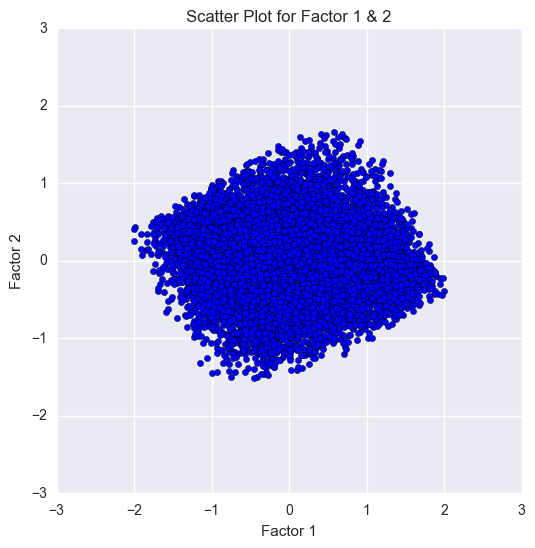

In [7]:
PROJECTION2 = PROJECTION.sample(10000)

plt.figure(figsize = (6, 6))
plt.scatter(PROJECTION2.FACTOR_1, PROJECTION2.FACTOR_2)
plt.xlabel('Factor 1')
plt.ylabel('Factor 2')
plt.title('Scatter Plot for Factor 1 & 2')
plt.ylim([-3,3])
plt.xlim([-3,3])
plt.show();

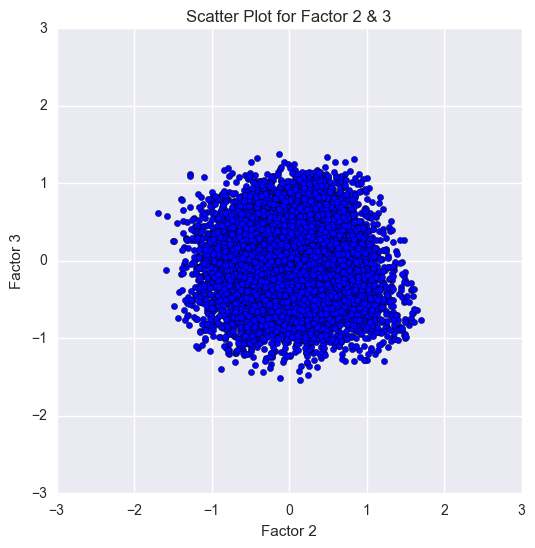

In [52]:
plt.figure(figsize = (6, 6))
plt.scatter(PROJECTION2.FACTOR_2, PROJECTION2.FACTOR_3)
plt.xlabel('Factor 2')
plt.ylabel('Factor 3')
plt.title('Scatter Plot for Factor 2 & 3')
plt.ylim([-3,3])
plt.xlim([-3,3])
plt.show();

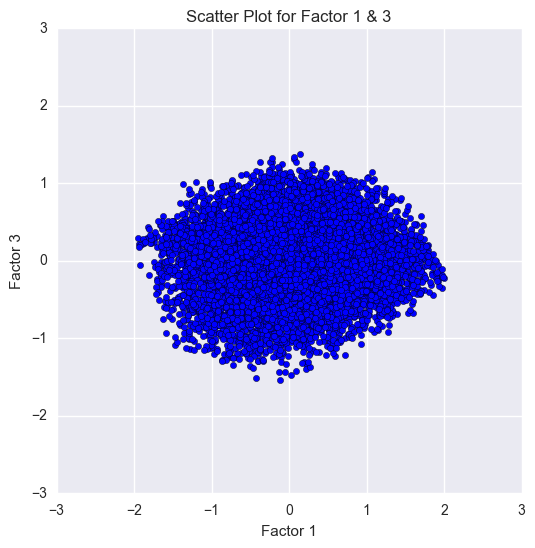

In [53]:
plt.figure(figsize = (6, 6))
plt.scatter(PROJECTION2.FACTOR_1, PROJECTION2.FACTOR_3)
plt.xlabel('Factor 1')
plt.ylabel('Factor 3')
plt.title('Scatter Plot for Factor 1 & 3')
plt.ylim([-3,3])
plt.xlim([-3,3])
plt.show();

In [11]:
DATATRAIN_PC = pd.concat([PROJECTION, Y], axis=1, join_axes=[FACTOR_DF.index])
DATATRAIN_PC.head(10)

,FACTOR_1,FACTOR_2,FACTOR_3,FACTOR_4,FACTOR_5,FACTOR_6,FACTOR_7,FACTOR_8,target
0,-0.429555,0.694317,-0.135925,-0.002578,0.198744,0.183172,-0.026735,-0.050689,0
1,-0.316584,-0.066286,-0.194630,0.107092,-0.716261,0.270906,0.110102,0.553827,0
2,0.045567,-0.797432,-0.123630,0.051750,0.091450,0.165136,-0.115573,0.156535,1
3,-0.522185,-0.468467,-0.523371,-0.106236,-0.237862,-0.167934,-0.191979,0.056033,1
4,-0.624160,1.130548,-0.478788,-0.116335,0.129016,0.304652,-0.357879,-0.321750,1
5,-1.327780,0.477891,-0.553104,0.000935,-0.146141,-0.541505,-0.273253,-0.140949,1
6,-0.486918,0.954677,-1.034094,-0.620403,0.051821,0.191935,-0.063314,0.214221,0
7,0.177381,1.008804,-0.210488,-0.618042,-0.539893,-0.263699,-0.082661,0.169180,1
8,-0.315406,0.567282,-0.304937,-0.310662,0.190694,-0.192844,-0.263264,-0.030644,1
9,-1.853236,0.513995,0.305492,0.170617,0.177757,-0.044544,0.240075,-0.095094,0


In [64]:
trainxx = DATATRAIN_PC.columns[:-1]
trainyy = DATATRAIN_PC.columns[-1]

XX = DATATRAIN_PC[trainxx]
YY = DATATRAIN_PC[trainyy]

seed = 1

XX_train, XX_test, yy_train, yy_test = train_test_split(XX, YY, test_size=0.5, random_state=0)

XX_train = np.array(XX_train)
yy_train = np.array(yy_train)

In [65]:
start_time = time.clock()

print("")
print("")
print("") 
print("List of Average ROC AUC According to the Algorithm (Training Dataset with K-Fold Cross-validation)")
print("") 

N_ES = 100
K = 10

start_time = time.clock()

model1 = LogisticRegression()
results1 = cross_val_score(model1, XX_train, yy_train, cv=K, scoring='roc_auc', n_jobs=1)
print("Logistic Regression (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results1.mean(), results1.std()))

model2 = KNeighborsClassifier(n_neighbors=5)
results2 = cross_val_score(model2, XX_train, yy_train, cv=K, scoring='roc_auc', n_jobs=1)
print("K Neighbors Classifier (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results2.mean(), results2.std()))

model3 = DecisionTreeClassifier()
results3 = cross_val_score(model3, XX_train, yy_train, cv=K, scoring='roc_auc', n_jobs=1)
print("Decision Tree Classifier (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results3.mean(), results3.std()))

model4 = BaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=N_ES, random_state=seed)
results4 = cross_val_score(model4, XX_train, yy_train, cv=K, scoring='roc_auc', n_jobs=1)
print("Bagging Decision Tree (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results4.mean(), results4.std()))

model5 = RandomForestClassifier(n_estimators=N_ES, max_features=5)
results5 = cross_val_score(model5, XX_train, yy_train, cv=K, scoring='roc_auc', n_jobs=1)
print("Random Forest (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results5.mean(), results5.std()))

model6 = ExtraTreesClassifier(n_estimators=N_ES, max_features=5)
results6 = cross_val_score(model6, XX_train, yy_train, cv=K, scoring='roc_auc', n_jobs=1)
print("Extra Randomized Forest (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results6.mean(), results6.std()))

model7 = AdaBoostClassifier(n_estimators=N_ES, random_state=seed)
results7 = cross_val_score(model7, XX_train, yy_train, cv=K, scoring='roc_auc', n_jobs=1)
print("AdaBoost Classifier (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results7.mean(), results7.std()))

model8 = GradientBoostingClassifier(n_estimators=N_ES, random_state=seed)
results8 = cross_val_score(model8, XX_train, yy_train, cv=K, scoring='roc_auc', n_jobs=1)
print("Gradient Boosting Classifier (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results8.mean(), results8.std()))

end_time = time.clock()




List of Average ROC AUC According to the Algorithm (Training Dataset with K-Fold Cross-validation)

Logistic Regression (Manual Tuning): (0.527) +/- (0.006)
K Neighbors Classifier (Manual Tuning): (0.508) +/- (0.007)
Decision Tree Classifier (Manual Tuning): (0.502) +/- (0.007)
Bagging Decision Tree (Manual Tuning): (0.510) +/- (0.008)
Random Forest (Manual Tuning): (0.513) +/- (0.006)
Extra Randomized Forest (Manual Tuning): (0.514) +/- (0.007)
AdaBoost Classifier (Manual Tuning): (0.517) +/- (0.008)
Gradient Boosting Classifier (Manual Tuning): (0.521) +/- (0.007)


# 4.2) Dimensionality Reduction with T-distributed stochastic neighbor embedding (t-SNE) on top of PCA

In [5]:
plt.rcParams['figure.figsize'] = (10.0, 10.0)
PROJECTION2 = pd.DataFrame(FACTOR_DF)
PROJECTION2 = PROJECTION2.iloc[:,0:3]
PROJECTION2.columns = ['FACTOR_1', 'FACTOR_2','FACTOR_3']
PROJECTION2.head(10)

,FACTOR_1,FACTOR_2,FACTOR_3
0,-0.429555,0.694317,-0.135925
1,-0.316584,-0.066286,-0.194630
2,0.045567,-0.797432,-0.123630
3,-0.522185,-0.468467,-0.523371
4,-0.624160,1.130548,-0.478788
5,-1.327780,0.477891,-0.553104
6,-0.486918,0.954677,-1.034094
7,0.177381,1.008804,-0.210488
8,-0.315406,0.567282,-0.304937
9,-1.853236,0.513995,0.305492


In [6]:
DATATRAIN_TSNE = PROJECTION2.sample(n=10000, replace=False, random_state=42, axis=0)

In [7]:
from sklearn.manifold import TSNE

start_time = time.clock()

tsne = TSNE(n_components=2, random_state=0)
X_tsne = tsne.fit_transform(DATATRAIN_TSNE)

end_time = time.clock()

print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")


Total Estimation Running Time:
233.37768531973893 Seconds


In [8]:
X_tsne = pd.DataFrame(X_tsne)
DATATRAIN_TSNE = pd.concat([X_tsne, Y], axis=1, join_axes=[X_tsne.index])
DATATRAIN_TSNE.columns = ["TSNE_1", "TSNE_2", "TARGET"]
DATATRAIN_TSNE.head(10)

,TSNE_1,TSNE_2,TARGET
0,5.865079,-5.837302,0
1,5.700181,-5.235131,0
2,1.819310,0.307341,1
3,7.501398,3.323009,1
4,5.769444,-5.455170,1
5,3.920056,0.367444,1
6,5.763769,0.733845,0
7,-1.968598,2.615655,1
8,3.676399,-2.758580,1
9,1.046426,2.297239,0


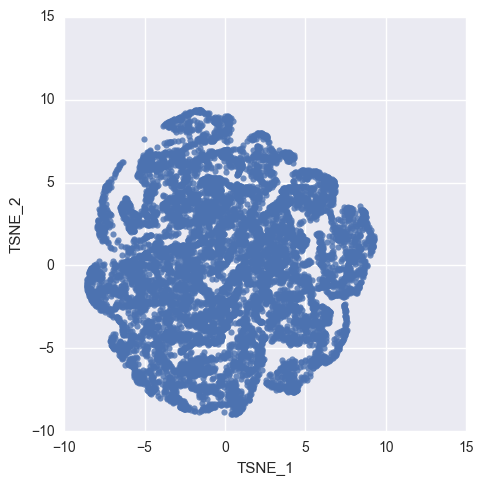

In [14]:
DATATRAIN_TSNE
plt.rcParams['figure.figsize'] = (10.0, 10.0)
sns.lmplot("TSNE_1", "TSNE_2", data = DATATRAIN_TSNE ,fit_reg=False);

# INTERACTIVE PLOTTING WITH t-SNE

In [24]:
import plotly
plotly.offline.init_notebook_mode()
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls

trace0 = go.Scatter(x = DATATRAIN_TSNE.TSNE_1,y = DATATRAIN_TSNE.TSNE_2,name = DATATRAIN_TSNE.TARGET,
hoveron = DATATRAIN_TSNE.TARGET,mode = 'markers',text = DATATRAIN_TSNE.TARGET,showlegend = False,
marker = dict(size = 8,color = DATATRAIN_TSNE.TARGET,colorscale ='Jet',showscale = False,
line = dict(width = 2,color = 'rgb(255, 255, 255)'),opacity = 0.8))

data = [trace0]

layout = go.Layout(title= 'Dimensionality Reduction with T-distributed stochastic neighbor embedding (t-SNE) on top of PCA',
hovermode= 'closest',xaxis= dict(title= 't-SNE First Principal Component',ticklen= 5,zeroline= False,gridwidth= 2),
    yaxis=dict(title= 't-SNE Second Principal Component',ticklen= 5,gridwidth= 2),showlegend= True)

fig = dict(data=data, layout=layout)
py.iplot(fig, filename='styled-scatter')

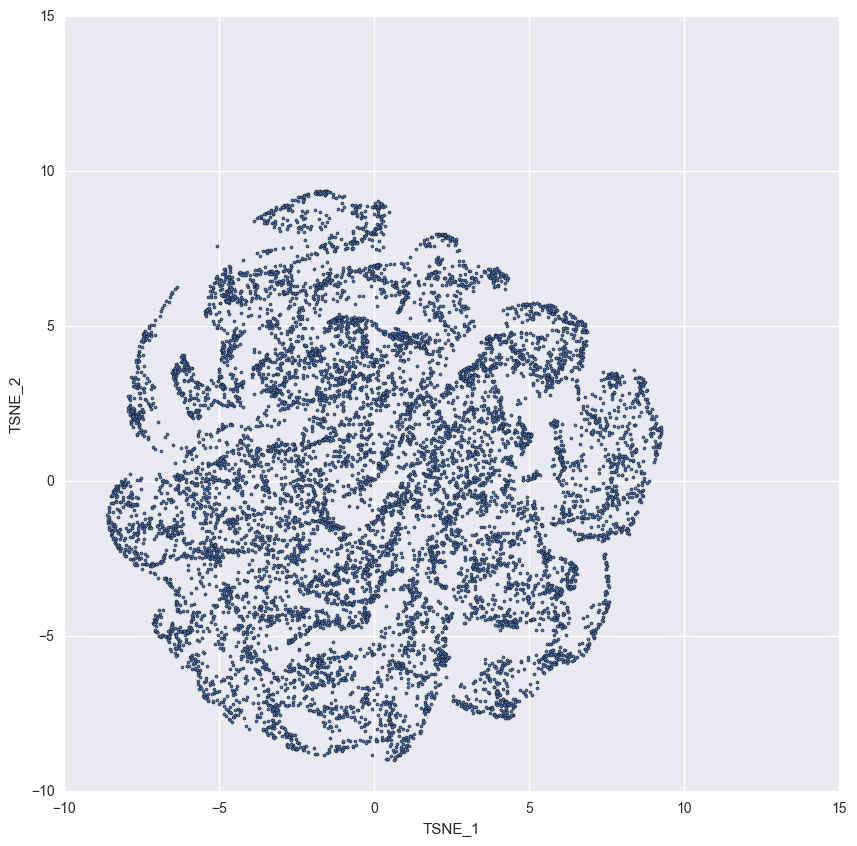

In [19]:
DATATRAIN_TSNE.plot.scatter("TSNE_1", "TSNE_2", s=5, figsize=(10, 10))

In [13]:
trainxxx = DATATRAIN_TSNE.columns[:-1]
trainyyy = DATATRAIN_TSNE.columns[-1]

XXX = DATATRAIN_TSNE[trainxxx]
YYY = DATATRAIN_TSNE[trainyyy]

seed = 1

XXX_train, XXX_test, yyy_train, yyy_test = train_test_split(XXX, YYY, test_size=0.5, random_state=0)

XXX_train = np.array(XXX_train)
yyy_train = np.array(yyy_train)

In [33]:
start_time = time.clock()

print("")
print("")
print("") 
print("List of Average ROC AUC According to the Algorithm (Training Dataset with K-Fold Cross-validation)")
print("") 

N_ES = 100
K = 10

model1 = LogisticRegression()
results1 = cross_val_score(model1, XXX_train, yyy_train, cv=K, scoring='roc_auc', n_jobs=1)
print("Logistic Regression (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results1.mean(), results1.std()))

model2 = KNeighborsClassifier(n_neighbors=5)
results2 = cross_val_score(model2, XXX_train, yyy_train, cv=K, scoring='roc_auc', n_jobs=1)
print("K Neighbors Classifier (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results2.mean(), results2.std()))

model3 = DecisionTreeClassifier()
results3 = cross_val_score(model3, XXX_train, yyy_train, cv=K, scoring='roc_auc', n_jobs=1)
print("Decision Tree Classifier (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results3.mean(), results3.std()))

model4 = BaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=N_ES, random_state=seed)
results4 = cross_val_score(model4, XXX_train, yyy_train, cv=K, scoring='roc_auc', n_jobs=1)
print("Bagging Decision Tree (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results4.mean(), results4.std()))

model5 = RandomForestClassifier(n_estimators=N_ES, max_features=1)
results5 = cross_val_score(model5, XXX_train, yyy_train, cv=K, scoring='roc_auc', n_jobs=1)
print("Random Forest (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results5.mean(), results5.std()))

model6 = ExtraTreesClassifier(n_estimators=N_ES, max_features=1)
results6 = cross_val_score(model6, XXX_train, yyy_train, cv=K, scoring='roc_auc', n_jobs=1)
print("Extra Randomized Forest (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results6.mean(), results6.std()))

model7 = AdaBoostClassifier(n_estimators=N_ES, random_state=seed)
results7 = cross_val_score(model7, XXX_train, yyy_train, cv=K, scoring='roc_auc', n_jobs=1)
print("AdaBoost Classifier (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results7.mean(), results7.std()))

model8 = GradientBoostingClassifier(n_estimators=N_ES, random_state=seed)
results8 = cross_val_score(model8, XXX_train, yyy_train, cv=K, scoring='roc_auc', n_jobs=1)
print("Gradient Boosting Classifier (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results8.mean(), results8.std()))

end_time = time.clock()

print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")




List of Average ROC AUC According to the Algorithm (Training Dataset with K-Fold Cross-validation)

Logistic Regression (Manual Tuning): (0.489) +/- (0.025)
K Neighbors Classifier (Manual Tuning): (0.508) +/- (0.021)
Decision Tree Classifier (Manual Tuning): (0.499) +/- (0.015)
Bagging Decision Tree (Manual Tuning): (0.507) +/- (0.016)
Random Forest (Manual Tuning): (0.510) +/- (0.015)
Extra Randomized Forest (Manual Tuning): (0.510) +/- (0.013)
AdaBoost Classifier (Manual Tuning): (0.499) +/- (0.019)
Gradient Boosting Classifier (Manual Tuning): (0.509) +/- (0.019)

Total Estimation Running Time:
25.34120065178797 Seconds


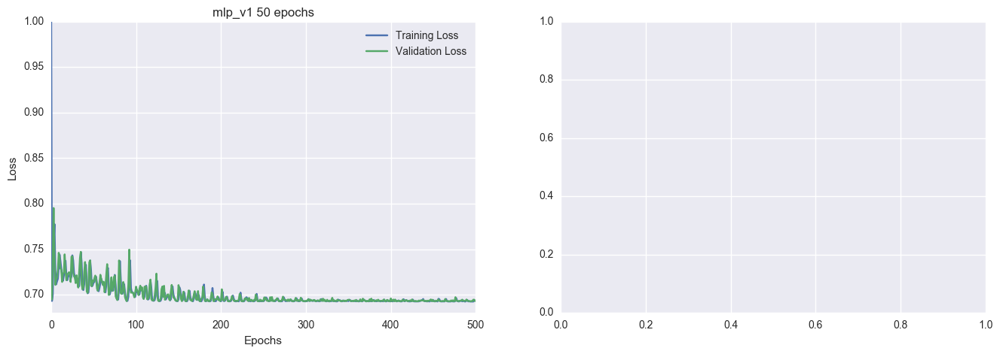

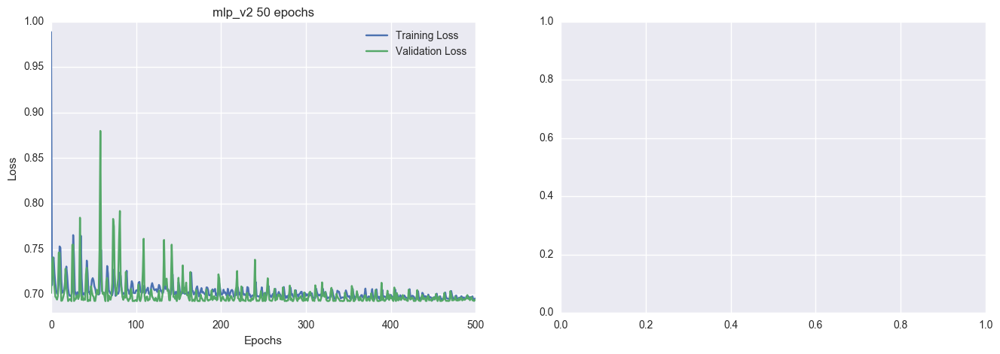

In [23]:
from keras.models import Sequential
from keras.models import save_model, load_model
from keras.layers.advanced_activations import PReLU
from keras.layers import Dense, Dropout, Activation, BatchNormalization
from keras.callbacks import EarlyStopping

model = Sequential()
model.add(Dense(400, input_dim=XXX.shape[1]))
model.add(Activation('sigmoid'))
model.add(Dense(300))
model.add(Activation('sigmoid'))
model.add(Dense(1))
model.add(Activation('sigmoid'))
model.compile(loss='binary_crossentropy', optimizer="rmsprop")

fit = model.fit(XXX.values, YYY, validation_split=0.2, batch_size=5000, nb_epoch=500, verbose=0)

hist = fit.history

models_history = {}
models_history['mlp_v1'] = hist

model = Sequential()
model.add(Dense(400, input_dim=XXX.shape[1]))
model.add(Dropout(0.5))
model.add(Activation('sigmoid'))
model.add(Dense(300))
model.add(Dropout(0.5))
model.add(Activation('sigmoid'))
model.add(Dense(1))
model.add(Activation('sigmoid'))
model.compile(loss='binary_crossentropy', optimizer="rmsprop")

fit1 = model.fit(XXX.values, YYY, validation_split=0.2, batch_size=5000, nb_epoch=500, verbose=0)

hist1 = fit1.history

models_history['mlp_v2'] = hist1

def plot_mlp_loss(history, title):
    fig, (ax1, ax2) = plt.subplots(1,2)
    fig.set_size_inches(16,5)

    ax1.set_title('{} 50 epochs'.format(title))
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Loss')
    ax1.set_xlim([0,500])
    ax1.set_ylim([0.68,1])
    ax1.grid(True)
    ax1.plot(history['loss'][0:500], label='Training Loss')
    ax1.plot(history['val_loss'][0:500], label='Validation Loss')
    ax1.legend()

plot_mlp_loss(models_history['mlp_v1'], 'mlp_v1')  
plot_mlp_loss(models_history['mlp_v2'], 'mlp_v2')

# Grid Search, Random Search and Bayesian Hyperparameter Search

Work in Progress...
Work in Progress...
Work in Progress...